In [261]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
import seaborn as sns


## pd.concat
- If `axis=0` (the default), it concatenates along rows, essentially appending one DataFrame below another.
- If `axis=1`, it concatenates along columns, effectively adding columns from one DataFrame next to columns from another.


In [244]:
# Sample DataFrames
df1 = pd.DataFrame({'A': [1, 2], 'B': [3, 4]})

df2 = pd.DataFrame({'C': [5, 6], 'D': [7, 8]})

# Concatenate along rows (axis=0)
result_row = pd.concat([df1, df2])
print("Concatenation along rows:")
print(result_row)

# Concatenate along columns (axis=1)
result_col = pd.concat([df1, df2], axis=1)
print("\nConcatenation along columns:")
print(result_col)


Concatenation along rows:
     A    B    C    D
0  1.0  3.0  NaN  NaN
1  2.0  4.0  NaN  NaN
0  NaN  NaN  5.0  7.0
1  NaN  NaN  6.0  8.0

Concatenation along columns:
   A  B  C  D
0  1  3  5  7
1  2  4  6  8


# Definition: Joining in DataFrames

Joining refers to combining columns from two or more DataFrames based on a common key or index.

## Usage

You use joins when you have different datasets that share a common identifier (e.g., an ID column) and you want to combine them horizontally based on that identifier.

## Types of Joins

- **Inner Join:**
  - Keeps only the rows where the keys exist in both DataFrames.

- **Outer Join:**
  - Keeps all rows from both DataFrames, filling in missing values with NaN where there are no matches.

- **Left Join:**
  - Keeps all rows from the left DataFrame and fills in missing values with NaN for the right DataFrame where there are no matches.

- **Right Join:**
  - Keeps all rows from the right DataFrame and fills in missing values with NaN for the left DataFrame where there are no matches.


In [195]:
data_employees = {
    'EmployeeID': [1, 2, 3, 4, 5],
    'Name': ['John Doe', 'Jane Smith', 'Mike Johnson', 'Emily Brown', 'Chris Lee'],
    'DepartmentID': [101, 102, 101, 103, 102]
}

data_departments = {
    'DepartmentID': [101, 102, 103, 104],
    'DepartmentName': ['HR', 'IT', 'Marketing', 'Finance']
}

df_employees = pd.DataFrame(data_employees)
df_departments = pd.DataFrame(data_departments)

In [196]:
# Inner join on 'DepartmentID'
inner_join_df = df_employees.merge(df_departments, on='DepartmentID', how='inner')
print("Inner Join:")
inner_join_df

Inner Join:


,EmployeeID,Name,DepartmentID,DepartmentName
0,1,John Doe,101,HR
1,3,Mike Johnson,101,HR
2,2,Jane Smith,102,IT
3,5,Chris Lee,102,IT
4,4,Emily Brown,103,Marketing


In [197]:
# 104 
outer_join_df = df_employees.merge(df_departments, on='DepartmentID', how='outer')
print("\nOuter Join:")
outer_join_df


Outer Join:


,EmployeeID,Name,DepartmentID,DepartmentName
0,1.0,John Doe,101,HR
1,3.0,Mike Johnson,101,HR
2,2.0,Jane Smith,102,IT
3,5.0,Chris Lee,102,IT
4,4.0,Emily Brown,103,Marketing
5,NaN,NaN,104,Finance


In [198]:
# Left join on 'DepartmentID'
left_join_df = df_employees.merge(df_departments, on='DepartmentID', how='left')
left_join_df

,EmployeeID,Name,DepartmentID,DepartmentName
0,1,John Doe,101,HR
1,2,Jane Smith,102,IT
2,3,Mike Johnson,101,HR
3,4,Emily Brown,103,Marketing
4,5,Chris Lee,102,IT


## EDA Read in Dataset Here 

In [263]:
raw_df = pd.read_csv("weatherAUS.csv")
raw_df 
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

In [262]:
raw_df.isnull().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

In [200]:
# Categorical variables

categorical = [var for var in raw_df.columns if raw_df[var].dtype=='object'] 
print(categorical)
## option for numeric values 
numeric_cols = list(raw_df.select_dtypes(include=np.number).columns)
print(numeric_cols)

['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [260]:
# Numerical variables
numerical = [var for var in raw_df.columns if raw_df[var].dtype in ['float64', 'int64']]
print('There are {} numerical variables\n'.format(len(numerical)))
print('The numerical variables are:', numerical)


There are 16 numerical variables

The numerical variables are: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [202]:

avg_max_temp_by_location = round(raw_df.groupby('Location')['MaxTemp'].mean(), 2)


In [203]:

# "What are the average maximum temperature ('MaxTemp'),  average Humidityafter9am  and total rainfall ('Rainfall') 
# for each location, grouped by whether rain is predicted for tomorrow ('RainTomorrow')?"

custom_aggregations = {
    'MaxTemp': 'mean',
    'Rainfall': 'sum', 
    "Humidity9am": "mean"
}

grouped_location_rain_tomorrow = raw_df.groupby(['Location', 'RainTomorrow']).agg(custom_aggregations).reset_index()
grouped_location_rain_tomorrow


,Location,RainTomorrow,MaxTemp,Rainfall,Humidity9am
0,Adelaide,No,23.932278,2188.0,56.996247
1,Adelaide,Yes,19.496361,2560.0,68.771470
2,Albany,No,20.566013,2968.3,73.255646
3,Albany,Yes,18.915359,3787.9,78.482565
4,Albury,No,23.418102,2997.8,72.202510
...,...,...,...,...,...
93,Witchcliffe,Yes,18.688269,6157.0,78.594148
94,Wollongong,No,21.669841,3932.4,64.753327
95,Wollongong,Yes,20.860674,6630.4,76.984441
96,Woomera,No,26.659261,1122.5,52.423784


In [204]:
## The graph shows the total amount of rainfall recorded at various locations in Australia.

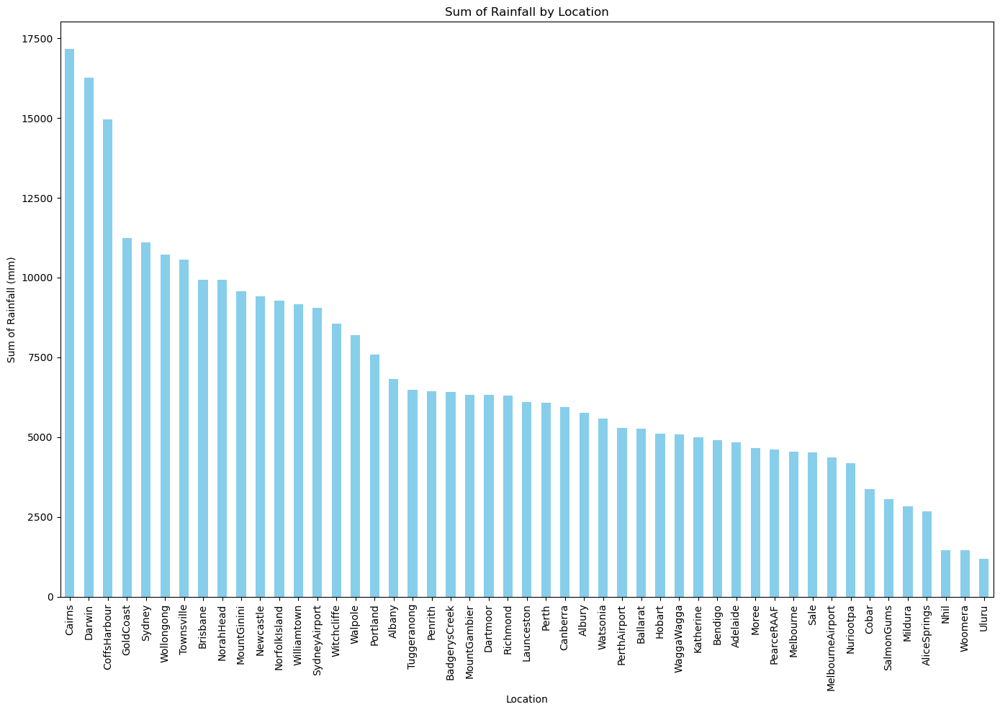

In [205]:
# get the total of rainfall per location sort values?

rainfall_by_location = raw_df.groupby('Location')['Rainfall'].sum().sort_values(ascending = False)

plt.figure(figsize=(14, 10))
rainfall_by_location.plot(kind='bar', color='skyblue')  # Change color to sky blue
plt.title('Sum of Rainfall by Location')
plt.xlabel('Location')
plt.ylabel('Sum of Rainfall (mm)')
plt.xticks()  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,14397.000000,14422.000000,14232.000000,8277.000000,7524.000000,13534.000000,14350.000000,14230.000000,14270.000000,14093.000000,13055.000000,13063.000000,8934.000000,8577.000000,14360.000000,14179.000000
mean,12.293193,23.243468,2.402811,5.501015,7.612998,40.214645,14.149617,18.742305,68.837211,51.789470,1017.446097,1015.088265,4.426573,4.494462,17.074373,21.714698
std,6.409285,7.132039,9.096474,4.278926,3.814660,13.737561,8.913151,8.901757,19.092064,20.857045,7.107208,7.008297,2.876995,2.719213,6.507249,6.954779
min,-8.500000,-3.700000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,4.000000,1.000000,982.200000,985.500000,0.000000,0.000000,-5.900000,-5.100000
25%,7.700000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.700000,1010.300000,1.000000,2.000000,12.400000,16.600000
50%,12.100000,22.800000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,53.000000,1017.400000,1015.100000,5.000000,5.000000,16.800000,21.200000
75%,16.900000,28.300000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.800000,7.000000,7.000000,21.600000,26.500000
max,31.200000,47.300000,367.600000,68.800000,14.200000,130.000000,67.000000,72.000000,100.000000,100.000000,1039.900000,1036.900000,8.000000,8.000000,40.200000,45.900000


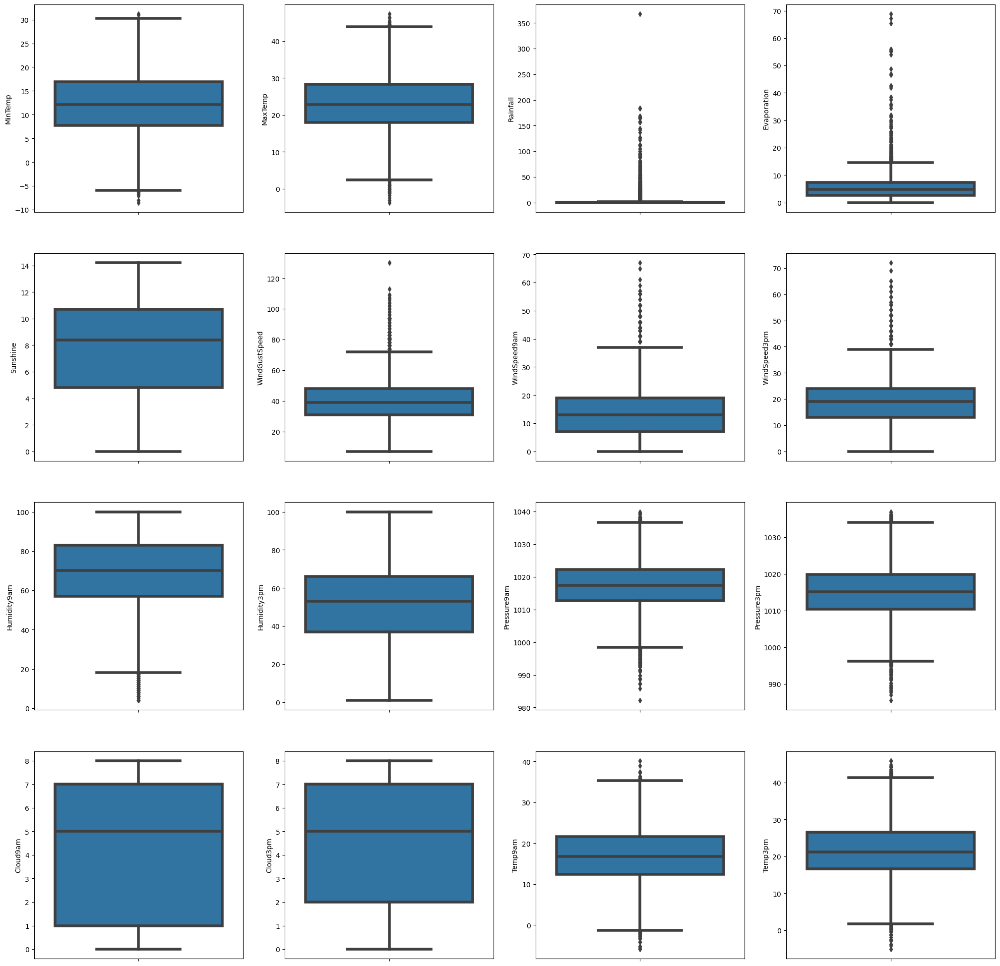

In [241]:
import math

num_cols = raw_df.columns[raw_df.dtypes!='O']

fig, axes = plt.subplots(4,4,figsize=(25, 25))
for i,col in enumerate(num_cols):
    plt_col = i%4  # Calculate the column index for the subplot
    plt_row = math.floor(i/4) #  calculates the rows 
    sns.boxplot(ax = axes[plt_row,plt_col], data = raw_df, y = col, linewidth=4)
raw_df.describe()

In [242]:
# Pivot table with Location as index, RainTomorrow as columns, and MaxTemp as values
pivot_table = raw_df.pivot_table(index='Location', columns=['RainTomorrow'], values='MaxTemp', aggfunc='mean')
pivot_table

RainTomorrow,No,Yes
Location,,
Adelaide,24.204825,19.398611
Albany,20.627451,18.170513
Albury,24.167453,19.220339
AliceSprings,29.656107,28.635484
BadgerysCreek,23.972489,22.826087
Ballarat,19.107759,14.740000
Bendigo,21.997083,20.369492
Brisbane,27.140590,25.665625
Cairns,29.660849,29.694118


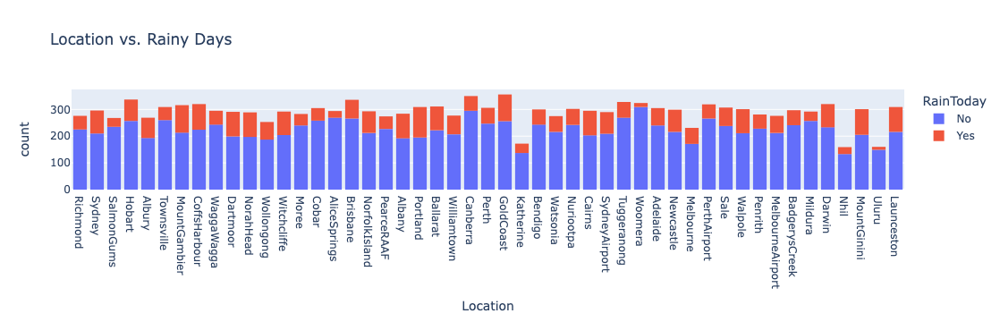

In [243]:
# location vs rain today vs tomorrow
px.histogram(raw_df, x='Location', title='Location vs. Rainy Days', color='RainToday')

In [247]:
avg_max_temp_by_location = raw_df.groupby('Location')['MaxTemp'].mean()

avg_max_temp_by_location

Location
Adelaide            22.979936
Albany              19.947872
Albury              23.134191
AliceSprings        29.548299
BadgerysCreek       23.707843
Ballarat            18.021019
Bendigo             21.675920
Brisbane            26.866667
Cairns              29.707261
Canberra            20.924432
Cobar               25.657929
CoffsHarbour        24.015480
Dartmoor            19.955670
Darwin              32.553438
GoldCoast           25.684722
Hobart              17.748083
Katherine           34.570349
Launceston          19.135806
Melbourne           20.199231
MelbourneAirport    19.890217
Mildura             24.809589
Moree               26.566102
MountGambier        20.229206
MountGinini         11.457605
Newcastle           23.901767
Nhil                22.810692
NorahHead           22.868942
NorfolkIsland       21.867235
Nuriootpa           21.492053
PearceRAAF          26.335374
Penrith             24.172535
Perth               25.100654
PerthAirport        26.166144
P

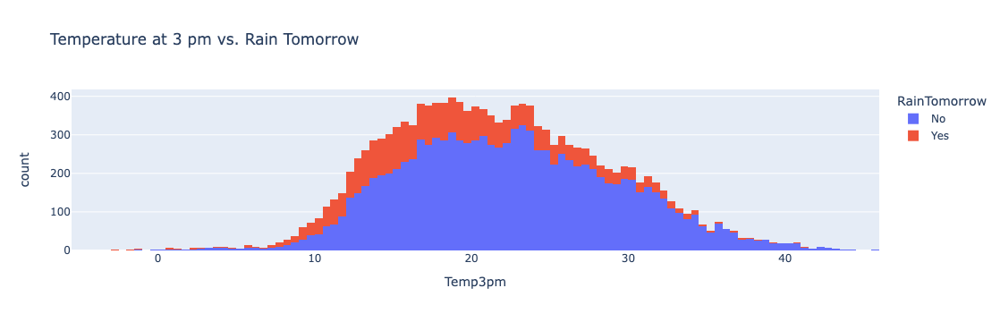

In [248]:
px.histogram(raw_df, 
             x='Temp3pm', 
             title='Temperature at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')



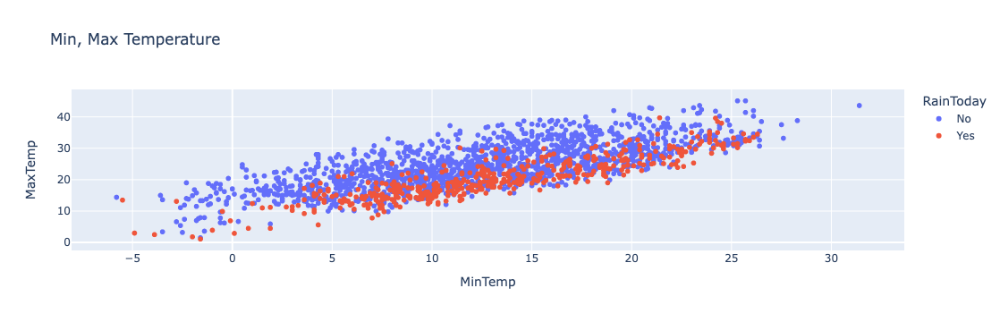

In [211]:
# scatter plot comparing min and max temperature
px.scatter(raw_df.sample(2000), x="MinTemp", y="MaxTemp", color= "RainToday", title = "Min, Max Temperature")

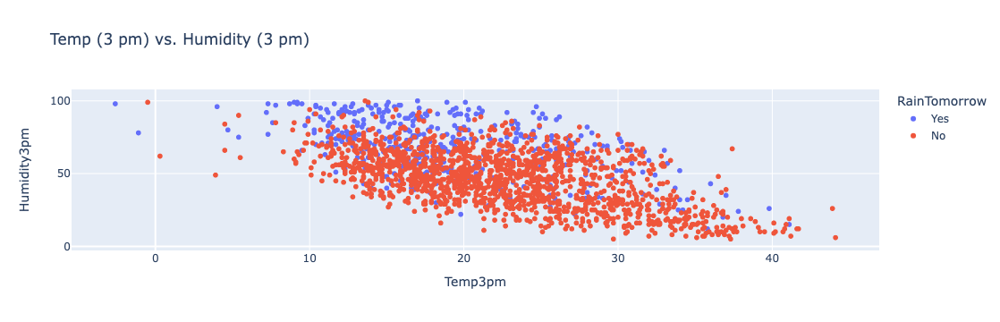

In [212]:
px.scatter(raw_df.sample(2000), 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')

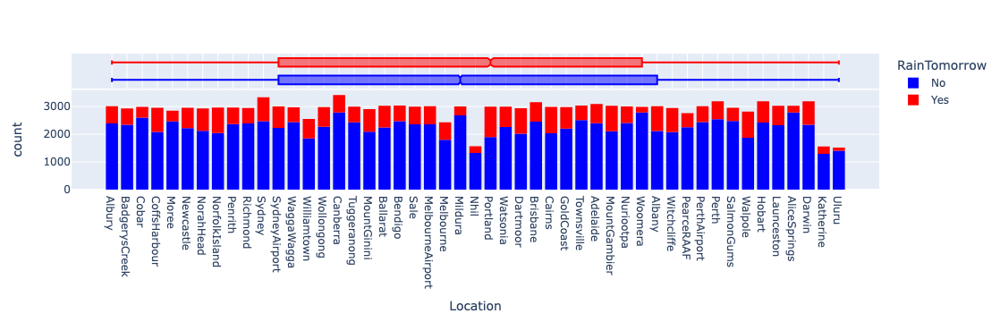

In [213]:
px.histogram(raw_df, x = "Location", marginal="box", color = "RainTomorrow", color_discrete_sequence=["Blue", "Red"])

## Train Test Split 

In [249]:
use_sample = True
sample_fraction = 0.1

if use_sample:
    raw_df = raw_df.sample(frac=sample_fraction).copy()
    
train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [250]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (873, 23)
val_df.shape : (291, 23)
test_df.shape : (291, 23)


- However, while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

- For the current dataset, we can use the Date column in the dataset to create another column for year. We'll pick the last two years for the test set, and one year before it for the validation set.

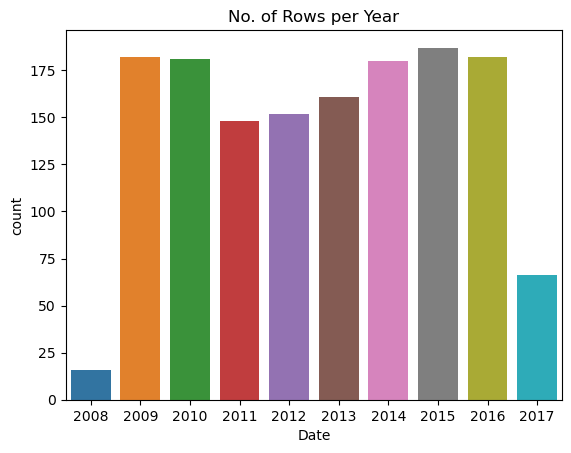

In [252]:
# when working with dates, there is a consideration to keep in mind basically split them into 2/ 3 cats before and after dates 
# countplot : counts the number of observations per category for a categorical variable, and displays the results as a bar chart.
plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year);

In [253]:
year = pd.to_datetime(raw_df.Date).dt.year
train_df = raw_df[year < 2015]
val_df = raw_df[year == 2015]
test_df = raw_df[year > 2015]

In [254]:
# now split the data into input and output 

In [255]:
input_cols = list(train_df.columns)[1:-1]
target_col = 'RainTomorrow'

In [220]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [221]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [222]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [223]:
train_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
27726,Richmond,11.8,17.6,0.0,3.6,NaN,W,70.0,WNW,W,13.0,33.0,46.0,35.0,1010.0,1010.3,NaN,NaN,15.2,16.8,No
32105,Sydney,9.0,21.8,0.0,3.8,10.4,WSW,31.0,WNW,E,13.0,11.0,61.0,38.0,1018.2,1013.5,1.0,1.0,12.7,19.2,No
124647,SalmonGums,11.4,24.2,0.0,NaN,NaN,NNW,33.0,NNW,NNW,20.0,11.0,46.0,26.0,NaN,NaN,NaN,NaN,18.5,22.5,No
131813,Hobart,13.1,16.6,0.0,7.4,2.8,WNW,39.0,NW,SE,15.0,17.0,61.0,61.0,1019.9,1019.5,NaN,NaN,16.5,15.8,No
3747,BadgerysCreek,21.5,31.2,2.0,NaN,NaN,N,46.0,NW,N,2.0,17.0,94.0,63.0,1011.0,1007.9,NaN,NaN,22.9,28.8,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139422,Darwin,23.8,30.9,0.0,8.4,1.5,E,39.0,SE,S,17.0,19.0,55.0,47.0,1012.4,1009.4,7.0,7.0,24.3,29.5,No
33983,SydneyAirport,16.3,22.1,6.0,5.0,9.9,S,41.0,W,S,11.0,30.0,66.0,66.0,1015.1,1011.2,3.0,4.0,21.0,21.2,Yes
85100,Brisbane,10.8,21.8,0.0,4.0,8.2,E,26.0,SW,ESE,7.0,9.0,63.0,49.0,1026.5,1023.2,3.0,4.0,15.5,20.4,No
44525,Wollongong,12.7,22.4,NaN,NaN,NaN,WNW,96.0,NW,WNW,11.0,19.0,47.0,34.0,1017.1,1014.2,NaN,1.0,19.1,22.2,NaN


In [224]:
train_targets

27726      No
32105      No
124647     No
131813     No
3747      Yes
         ... 
139422     No
33983      No
85100      No
44525      No
64279      No
Name: RainTomorrow, Length: 10170, dtype: object

In [225]:
# get the numeric columns
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()


In [226]:
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,10093.000000,10124.000000,9969.000000,6325.000000,5955.000000,9415.000000,10006.000000,10011.000000,10001.000000,10018.000000,9210.000000,9220.000000,6447.000000,6343.000000,10051.000000,10066.000000
mean,12.109977,22.994301,2.492256,5.274466,7.609085,40.413489,14.261643,18.786535,68.690431,51.876422,1017.324278,1015.009295,4.282922,4.401703,16.881494,21.531383
std,6.352893,7.030731,9.607462,3.821344,3.830038,13.951726,9.041008,8.989176,19.081796,20.948729,7.121163,7.014664,2.861091,2.699862,6.435935,6.872110
min,-8.500000,-3.700000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,4.000000,1.000000,985.800000,985.500000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.800000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.600000,1010.300000,1.000000,2.000000,12.200000,16.500000
50%,11.900000,22.500000,0.000000,4.600000,8.400000,39.000000,13.000000,19.000000,69.000000,53.000000,1017.300000,1015.000000,5.000000,5.000000,16.600000,21.000000
75%,16.700000,28.000000,0.800000,7.200000,10.700000,48.000000,20.000000,24.000000,83.000000,66.000000,1022.200000,1019.700000,7.000000,7.000000,21.400000,26.200000
max,31.200000,47.300000,367.600000,55.200000,14.200000,130.000000,67.000000,69.000000,100.000000,100.000000,1039.100000,1036.900000,8.000000,8.000000,40.200000,45.900000


In [227]:
train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [228]:
from sklearn.impute import SimpleImputer

In [229]:
imputer = SimpleImputer(strategy = 'mean')

In [230]:
raw_df[numeric_cols].isna().sum()

MinTemp           149
MaxTemp           124
Rainfall          314
Evaporation      6269
Sunshine         7022
WindGustSpeed    1012
WindSpeed9am      196
WindSpeed3pm      316
Humidity9am       276
Humidity3pm       453
Pressure9am      1491
Pressure3pm      1483
Cloud9am         5612
Cloud3pm         5969
Temp9am           186
Temp3pm           367
dtype: int64

In [231]:
train_inputs[numeric_cols].isna().sum()

MinTemp            77
MaxTemp            46
Rainfall          201
Evaporation      3845
Sunshine         4215
WindGustSpeed     755
WindSpeed9am      164
WindSpeed3pm      159
Humidity9am       169
Humidity3pm       152
Pressure9am       960
Pressure3pm       950
Cloud9am         3723
Cloud3pm         3827
Temp9am           119
Temp3pm           104
dtype: int64

In [232]:
train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [233]:
imputer.fit(raw_df[numeric_cols])

SimpleImputer()

In [140]:
list(imputer.statistics_)

[12.155005554012774,
 23.22474849094567,
 2.3193893344589838,
 5.531605208713642,
 7.646370806041973,
 39.90518518518518,
 13.98892526293794,
 18.532233146067416,
 68.94592136560794,
 51.53685329553508,
 1017.6930680854343,
 1015.2745031582192,
 4.422032757460175,
 4.483446024714386,
 16.94958953666342,
 21.682381522428]

In [234]:
train_inputs.isnull().sum()

Location            0
MinTemp            77
MaxTemp            46
Rainfall          201
Evaporation      3845
Sunshine         4215
WindGustDir       760
WindGustSpeed     755
WindDir9am        777
WindDir3pm        257
WindSpeed9am      164
WindSpeed3pm      159
Humidity9am       169
Humidity3pm       152
Pressure9am       960
Pressure3pm       950
Cloud9am         3723
Cloud3pm         3827
Temp9am           119
Temp3pm           104
RainToday         201
dtype: int64

In [182]:
train_inputs[numeric_cols].isna().sum()

MinTemp            72
MaxTemp            60
Rainfall          207
Evaporation      3887
Sunshine         4280
WindGustSpeed     793
WindSpeed9am      158
WindSpeed3pm      157
Humidity9am       164
Humidity3pm       160
Pressure9am      1042
Pressure3pm      1030
Cloud9am         3778
Cloud3pm         3859
Temp9am           111
Temp3pm            96
dtype: int64

In [183]:
raw_df[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,14404.000000,14413.000000,14214.000000,8217.000000,7481.000000,13500.000000,14357.000000,14240.000000,14294.000000,14110.000000,12969.000000,12982.000000,8914.000000,8578.000000,14374.000000,14201.000000
mean,12.155006,23.224748,2.319389,5.531605,7.646371,39.905185,13.988925,18.532233,68.945921,51.536853,1017.693068,1015.274503,4.422033,4.483446,16.949590,21.682382
std,6.452212,7.115332,8.482161,4.351038,3.813201,13.572387,8.982907,8.785747,19.103296,20.917244,7.093529,7.031009,2.906338,2.719444,6.534368,6.916003
min,-7.000000,-2.400000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,982.900000,983.200000,0.000000,0.000000,-5.200000,-4.000000
25%,7.500000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,36.000000,1013.000000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.900000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,17.000000,70.000000,52.000000,1017.700000,1015.200000,5.000000,5.000000,16.600000,21.100000
75%,16.900000,28.200000,0.600000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.500000,1020.100000,7.000000,7.000000,21.600000,26.400000
max,29.900000,46.600000,367.600000,86.200000,14.500000,135.000000,87.000000,74.000000,100.000000,100.000000,1040.600000,1037.900000,8.000000,8.000000,39.100000,45.400000


In [235]:
from sklearn.preprocessing import MinMaxScaler

In [236]:
scaler = MinMaxScaler()

In [237]:
scaler.fit(raw_df[numeric_cols])

MinMaxScaler()

In [238]:
print('Minimum:')
list(scaler.data_min_)

Minimum:


[-8.5,
 -3.7,
 0.0,
 0.0,
 0.0,
 7.0,
 0.0,
 0.0,
 4.0,
 1.0,
 982.2,
 985.5,
 0.0,
 0.0,
 -5.9,
 -5.1]

In [239]:
print('Minimum:')
list(scaler.data_max_)

Minimum:


[31.2,
 47.3,
 367.6,
 68.8,
 14.2,
 130.0,
 67.0,
 72.0,
 100.0,
 100.0,
 1039.9,
 1036.9,
 8.0,
 8.0,
 40.2,
 45.9]

In [240]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [150]:
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,10037.000000,10049.000000,9902.000000,6222.000000,5829.000000,9316.000000,9951.000000,9952.000000,9945.000000,9949.000000,9067.000000,9079.000000,6331.000000,6250.000000,9998.000000,10013.000000
mean,0.513859,0.518219,0.006344,0.061990,0.526869,0.258293,0.161147,0.251305,0.688076,0.515833,0.600734,0.584125,0.536902,0.550660,0.496211,0.516528
std,0.174133,0.142780,0.023853,0.048332,0.262853,0.107372,0.103941,0.119371,0.190353,0.208227,0.122332,0.127639,0.360581,0.336592,0.146003,0.138064
min,0.005420,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.074523,0.018282,0.000000,0.000000,0.000000,0.024291
25%,0.390244,0.412245,0.000000,0.030162,0.337931,0.187500,0.080460,0.175676,0.570000,0.370000,0.521664,0.497258,0.125000,0.250000,0.390519,0.414980
50%,0.506775,0.504082,0.000000,0.053364,0.586207,0.250000,0.149425,0.256757,0.700000,0.520000,0.599653,0.583181,0.625000,0.625000,0.489842,0.504049
75%,0.642276,0.618367,0.001632,0.083527,0.737931,0.320312,0.218391,0.324324,0.830000,0.660000,0.684575,0.672761,0.875000,0.875000,0.600451,0.611336
max,1.000000,0.995918,1.000000,0.798144,0.979310,1.000000,0.850575,0.905405,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [151]:
raw_df[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [152]:
from sklearn.preprocessing import OneHotEncoder

In [153]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [154]:
encoder.fit(raw_df[categorical_cols])

/Users/jaredpeck/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



OneHotEncoder(handle_unknown='ignore', sparse=False, sparse_output=False)

In [155]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

In [156]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [264]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

/var/folders/97/2sz1zkqj3pl2ynflgjwjg_nh0000gn/T/ipykernel_8697/1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/97/2sz1zkqj3pl2ynflgjwjg_nh0000gn/T/ipykernel_8697/1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/97/2sz1zkqj3pl2ynflgjwjg_nh0000gn/T/ipykernel_8697/1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.conca

In [177]:
pd.set_option('display.max_columns', None)

In [178]:
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes,RainToday_nan
57706,Ballarat,0.487805,0.424490,0.000000,NaN,NaN,S,0.234375,SSE,SSE,0.172414,0.324324,0.86,0.83,0.677643,0.698355,0.750,1.000,0.437923,0.374494,No,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
36262,SydneyAirport,0.512195,0.591837,0.000000,0.092807,0.765517,NE,0.281250,NW,NE,0.149425,0.351351,0.45,0.33,0.519931,0.451554,0.000,0.000,0.528217,0.582996,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
143802,Katherine,0.802168,0.781633,0.000000,0.092807,NaN,E,0.289062,SE,E,0.103448,0.270270,0.78,NaN,0.497400,0.460695,0.250,NaN,0.749436,NaN,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
132768,Hobart,0.436314,0.442857,0.019587,0.076566,0.648276,W,0.679688,NE,NW,0.229885,0.324324,0.47,0.44,0.386482,0.404022,0.375,0.875,0.419865,0.429150,Yes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [160]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (10109, 124)
train_targets: (10109,)
val_inputs: (1811, 124)
val_targets: (1811,)
test_inputs: (2626, 124)
test_targets: (2626,)


In [162]:
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

In [163]:
%%time
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

CPU times: user 4.48 ms, sys: 1.66 ms, total: 6.13 ms
Wall time: 5.85 ms


CPU times: user 117 ms, sys: 45.4 ms, total: 162 ms
Wall time: 1.23 s


train_inputs: (10109, 124)
train_targets: (10109,)
val_inputs: (1811, 124)
val_targets: (1811,)
test_inputs: (2626, 124)
test_targets: (2626,)


In [166]:
val_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes,RainToday_nan
74412,Nhil,0.739837,0.873469,0.000000,NaN,NaN,NW,0.453125,NE,W,0.149425,0.202703,0.26,0.11,0.538995,0.495430,NaN,NaN,0.711061,0.856275,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
72837,Mildura,0.609756,0.706122,0.000000,0.185615,0.917241,WSW,0.203125,S,WSW,0.126437,0.229730,0.60,0.23,0.603120,0.570384,0.625,0.000,0.566591,0.684211,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
126213,SalmonGums,0.216802,0.585714,0.000000,NaN,NaN,SE,0.187500,NNE,WNW,0.126437,0.121622,0.44,0.23,NaN,NaN,NaN,NaN,0.528217,0.603239,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
144562,Uluru,0.623306,0.473469,0.023395,NaN,NaN,S,0.335938,S,S,0.321839,0.297297,0.89,0.76,0.327556,0.343693,1.000,1.000,0.487585,0.487854,Yes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0